In [ ]:
import numpy as np
import matplotlib.pylab as plt
from sklearn.tree import DecisionTreeRegressor

from IPython.display import  Audio,Image,YouTubeVideo

In [ ]:
def rysuj_residuum_i_regresor(X,Y,dY, Y_hat_k, fig ):
  fig.add_subplot(1,2,1)
  plt.plot(X,dY,'o')
  plt.plot(X,Y_hat_k, '-')
  plt.ylim((Y.min(),Y.max()))
  plt.title('residuum i k-ty regresor')

def rysuj_dopasowanie(X,Y, Y_pred, fig):
  fig.add_subplot(1,2,2)
  plt.plot(X,Y, 'o')
  plt.plot(X,Y_pred, '-')
  plt.ylim((Y.min(),Y.max()))
  plt.title('ciąg uczący i dopasowanie')
  plt.show()


# Ensemble
- koncepcja polega na tym aby do podejmowania decyzji albo przewidywania wartości użyć "ensemblu" ("komitetu") prostych predyktorów
- w najporstszym przypadku wszystkie predyktory głosują z jednakową wagą
- w bardziej złożonym - wagi mogłyby być zależne np. od tego na ile dobry i pewny jest dany  predyktor.



# Boostowanie
w ogólności:
- tworzymy serię słabych predyktorów (weak learners)
- każdy poprawia błędy które jeszcze pozostały po sumie poprzednich predyktorów


# Wyprowadzenie ogólnego algorytmu gradient boost
(za Friedman, J. 2001. “Greedy Function Approximation : A Gradient Boosting Machine: The Annals of Statistics , Vol . 29 , No . 5 ( Oct ., 2001 ), Pp . 1189-1232 https://www.jstor.org/stable/2699986. )

Problem, który chcemy rozwiązać jest następujący.

Mamy zbiór uczący $(x,y)$ {$x$ - cała dziedzina}. Zakładamy, że istniej funkcyjna zależność
$$ x \xrightarrow{F} y$$.

Chcemy znaleźć taką estymatę $\hat F(x)$, że pasuje ona do danych ze zbioru uczącego najlepiej w sensie minimalizowania pewnej funkcji kosztu $L(y,F(x))$:
$$\hat F(x) = \arg \min_{F(x)} L(y, F(x)) $$

W dotychczas omawianych podejściach jako funkcje $F$ wybieraliśmy jakąś funkcje z parametrami$F(x; \theta)$ i proces uczenia polegał na optymalizacji owych parametrów $\theta$, np. za pomocą technik gradientowych.

Podstawową ideą stojącą za agorytmem "gradient boost" jest optymalizacja nieparametryczna w przestrzeni funkcji.
Estymowana funkcja $\hat F$ jest wyrażana przez rozwinięcie w addytywne składowe:
$$ \hat F(x) = \sum_{m=0}^M\hat f_m(x) $$
Funkcja $\hat f_0$ to początkowe "zgadnięcie" a pozostałe funkcje to "boosty".

Do rozwiązania tego problemu też można wykorzystać technikę optymalizacji gradientowej.
Kolejne funkcje $\hat f_m(x)$ można wybierać jako proporcjonalne do gradientu wartości oczekiwanej funkcji kosztu $g_m(x)
$.

$$\hat f_m(x) = -\rho_m g_m(x)$$

gdzie

$$g_m(x) = \left[  \frac{\partial E_y [L(y,F(x))|x]}{\partial F(x)} \right]_{F(x) = F_{m-1}(x)} $$
i
$$F_{m-1}(x) = \sum_{i=0}^{m-1} f_i(x) $$


> Pojawiająca się w powyższym wzorze
> $$ E_y [L(y,F(x))|x] = \int L(y,F(x))p(x,y)dxdy$$
>
> Funkcja kosztu  $L(y, F(x))$ :
> * Mierzy różnicę między rzeczywistą wartością  $y$  a przewidywaniem modelu  $F(x)$ .
> * Przykłady często stosowanych funkcji kosztu:
>     * kwadratowa:  $L(y, F(x)) = (y - F(x))^2 $,
> 	* wartość absolutna:  $L(y, F(x)) = |y - F(x)|$ ,
>
> Rozkład łączny  $p(x, y) $:
> * Reprezentuje prawdopodobieństwo wystąpienia każdej pary wartości $( x, y)$ w danych.
>   * Koduje wszystkie statystyczne zależności między wejściami  $x$  a wynikami  $y$ .

Zakładając dostateczną regularność, która pozwala na zmianę kolejności różniczkowania i całkowania, $g_m(x)$ jest wartością oczekiwaną gradientu funkcji kosztu:

$$g_m(x) = E_y \left[  \frac{\partial  L(y,F(x))]}{\partial F(x)} |x \right]_{F(x) = F_{m-1}(x)} $$

Mnożnik $\rho_m$ można znaleźć poprzez minimalizację:
$$ \rho_m = \arg \min_{\rho} E_{y,x} L\left(y, F_{m-1}(x) - \rho g_m(x)\right) $$

Powyższe rozumowanie załamuje się gdy zbiór uczący zawiera skończoną liczbę przykładów:
$\{(x^{(i)},y^{(i)})\}, i = 1,\dots,N$
bo nie da się dokładnie wyznaczyć $E_y[\cdot|x]$.

Rozwiązaniem jest zastosowanie odpowiednio gładkich funkcji "boostowych" poprzez zapostulowanie ich w wersji sparametryzowanej. Wtedy problem optymalizacji funkcyjnej redukuje się do optymalizacji parametrów:
$$ \left\{ \beta_m, a_m \right\}_0^M = \arg \min_{\{\beta'_m, a'_m\}_0^M} \sum_{i=1}^N L \left(y^{(i)}, \sum_{m=0}^M \beta'_m h(x^{(i)}; a'_m) \right)$$

Zazwyczaj znalezienie wszystkich parametrów $$ \left\{ \beta_m, a_m \right\}_0^M $$ na raz jest trudne.

Praktykuje się więc rozwiązanie iteracyjne gdzie:
 - znajduje się funkcję $F_0(x)$
 - (*) dla następnych $m$ (po kolei):
   - $$\left( \beta_m, a_m \right) = \arg \min_{\beta, a} \sum_{i=1}^N L \left( y^{(i)}, F_{m-1} +\beta h(x^{(i)}; a) \right)$$
  - $$F_m(x)= F_{m-1}(x) +\beta_m h(x^{(i)}; a_m)$$

W uczeniu maszynowym
 **słabe predyktory** (ang. weak learners) z parametrami $h(x, \theta)$ - to najczęściej proste drzewa decyzyjne (w najprostszej wersji mogłyby to być "pnie" (ang. _stump_)- drzewa o pojedynczym rozgałęzieniu).

Zauważmy, że nowo dodawane predyktory nie wpływają na wcześniej wyznaczone.

Pytanie, jak efektywnie rozwiązać problem optymalizacyjny (*) ?

- Mając przybliżenie $F_{m-1}(x)$, nowy predyktor $\beta_m h(x, a_m)$ może być postrzegany jako zachłanny krok w kierunku $\hat F(x)$.
- Optymalnym kierunkiem tego kroku byłby ujemny gradient $-g_m(x)$ opisany wcześniej; jego analogiem dla dyskretnego zestawu punktów $\{x^{(i)}\}$ jest:

$$-g_m(x^{(i)}) = -\left[  \frac{\partial  L(y^{(i)},F(x^{(i)}))]}{\partial F(x^{(i)})}\right]_{F(x) = F_{m-1}(x)} $$

- ten gradient znany jest tylko w skończonej liczbie punktów

- ponadto, ponieważ pracujemy na skończonej liczbie punktów $x$ to wybraliśmy gładkie fukcje boostowe w postaci $h(x,a)$ więc nie mamy gwarancji, że jakś funkcja z tej rodziny pokrywa się z kierunkiem najszybszego spadku. Najlepszą taką funkcję możemy dobrać wybierając jej parametry tak aby minimalizowały błąd kwadratowy:
$$a_m = \arg \min_{a, \beta} \sum_{i = 1}^N \left[-g_m(x^{(i)}) -\beta h(x^{(i)},a) \right]^2$$

- dalej zamiast "idealnego" gradientu $-g_m(x)$ wykorzystujemy ten dopasowany do niego predyktor $h(x, a_m)$ i poszukujemy optymalnej długości kroku:
 $$ \rho_m = \arg \min_{\rho} \sum_{i=1}^N L \left(y^{(i)} , F_{m-1}(x^{(i)}) + \rho h(x^{(i)},a_m) \right)$$


a nastepnie uaktualniamy przybliżenie:
$$F_m(x) = F_{m-1}(x) +\rho_m h(x, a_m)$$

Widać, że w każdym kroku predyktor dopasowujemy do "pseudo odpowiedzi" $\hat y^{(i)} = -g_m(x^{(i)})$

# Generyczny algorytm gradient boost:

1. $F_0(x) = \arg \min_{\rho} \sum_{i = 1}^N L(y^{(i)}, \rho)$
2. dla $m = 1,\dots,M$ powtarzaj kroki 3-6:
  1. oblicz pseudo odpowiedzi dla wszystkich punktów $(i)$:
  $$ -g_m(x^{(i)}) = -\left[  \frac{\partial  L(y^{(i)},F(x^{(i)}))]}{\partial F(x^{(i)})}\right]_{F(x) = F_{m-1}(x)}$$
  2. dopasuj predyktor:
  $$a_m = \arg \min_{a, \beta} \sum_{i = 1}^N \left[-g_m(x^{(i)}) -\beta h(x^{(i)},a) \right]^2$$
  3. dopasuj długość kroku: $$ \rho_m = \arg \min_{\rho} \sum_{i=1}^N L \left(y^{(i)} , F_{m-1}(x^{(i)}) + \rho h(x^{(i)},a_m) \right)$$
  4. uaktualnij predykcję:
  $$F_m(x) = F_{m-1}(x) +\rho_m h(x, a_m)$$


## Przykład z regresją: funkcja kosztu -> błąd kwadratowy
- dla każdego punku $y^{(i)}$ w zbiorze uczącym robimy predykcję $\hat y^{(i)} = \hat F(x^{(i)})$

- błąd predykcji oznaczmy jako $L(y, \hat y)$

- może to być bład średnokwadratowy (MSE): $L(y, \hat y) = \frac{1}{2}\sum_i\left(y^{(i)} - \hat y^{(i)}\right)^2$
  - przyzczynek od $i$ tego punktu jest $L^{(i)}(y, \hat y) = \frac{1}{2}\left(y^{(i)} - \hat y^{(i)}\right)^2$
  

- Jak zmniejszyć ten błąd?
  - obliczmy gradient $L^{(i)}$ względem $\hat y$:
  $$\nabla_{\hat y} L^{(i)} = -(y^{(i)} - \hat y^{(i)})$$
  

  - zatem aby zmniejszyć przyczynek do błedu od $i$ tego punktu musimy go zmienić w kierunku przeciwnym do gradientu:
  $$\hat y^{(i)} := \hat y^{(i)} - \alpha (-(y^{(i)} - \hat y^{(i)}))  $$

  $$\hat y^{(i)} := \hat y^{(i)} + \alpha (y^{(i)} - \hat y^{(i)}) $$

  - Residuum $dY$ to różnica między porządaną $y$ a aktualnie przewidywaną wartością $\hat y$:
$$dY = y -\hat y $$

  - Wyliczona powyżej zmina $\hat y$ prowadzi do zmiany residuum:
$$dY = y -\hat y  $$

$$ dY = \underbrace{y - \hat y}_{poprzednie \ dY} - \alpha (y - \hat y))$$

$$ dY := dY - \alpha (y - \hat y)$$

Podsumowując: gradientowa minimalizacja błędu doporwadziła nas do reguły uaktualniania residuum.

## Zobaczmy jakiś praktyczny przykład:

In [ ]:
# szkielet algorytmu w pythonie
F0 = Y.mean() # odgadnięcie
dY = Y -F0# na początek
for k in range(Nboost):
  # fitujemy predyktor do aktualnego residuum
  predyktor = DecisionTreeRegressor(max_depth =1).fit(X,dY)
  Y_hat_k = predyktor.predict(X) # uzyskuję przewidywania k-tego predyktora
  dY = dY - alpha* Y_hat_k #Uaktualniam residuudm

Aby się przekonać czy ten pomysł działa obudujemy go w przykładowe dane i rysunki

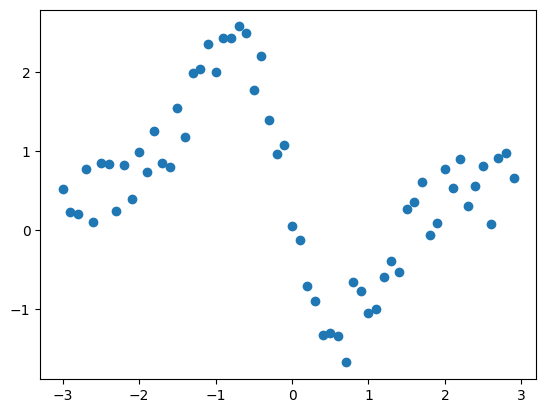

In [ ]:
# Tworzymy zbiór uczący:
X = np.arange(-3,3.1,0.1)
Y = np.diff(np.exp(-(X)**2/1))
X = X[:-1]
X = X.reshape(-1, 1)
Y = 20*Y+np.random.rand(X.shape[0])
plt.plot(X, Y, 'o')
plt.show()

In [ ]:
def predict_boosted(F0, predyktory, alpha, X_test):
  # funkcja do oblicznia całkowitej predykcji,
  # która jest sumą predykcji poszczególnych  predyktorów

  wynik = F0
  for k, predyktor_k_ty in enumerate(predyktory):
    wynik = wynik + alpha * predyktor_k_ty.predict(X_test)
  return wynik

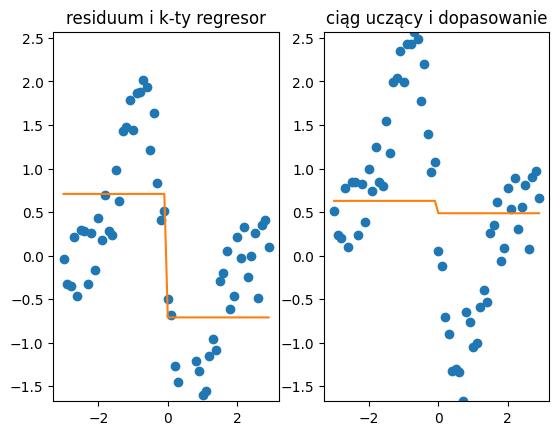

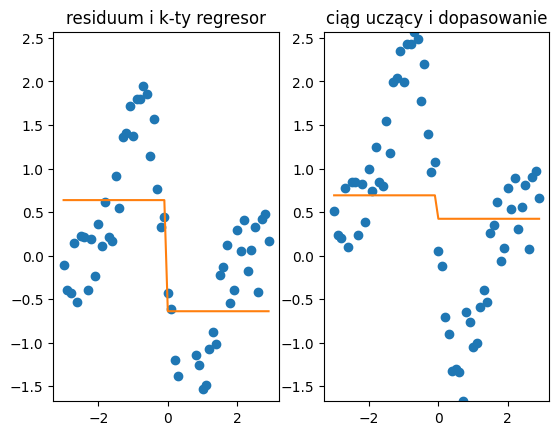

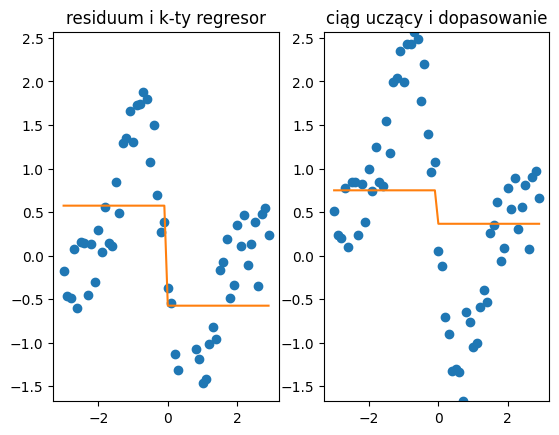

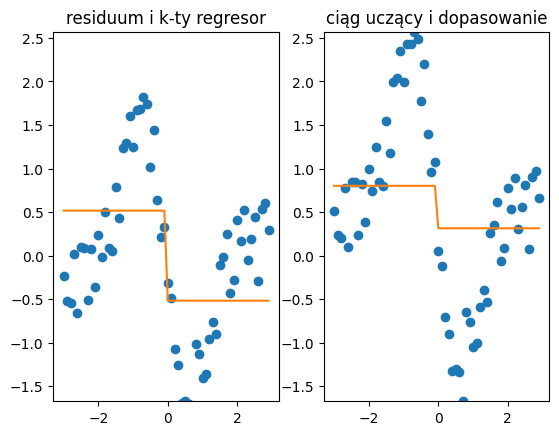

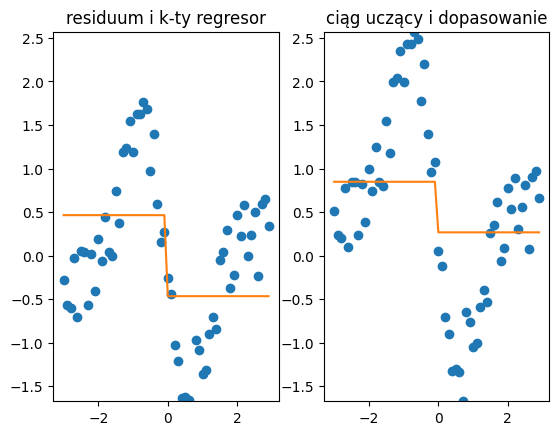

...

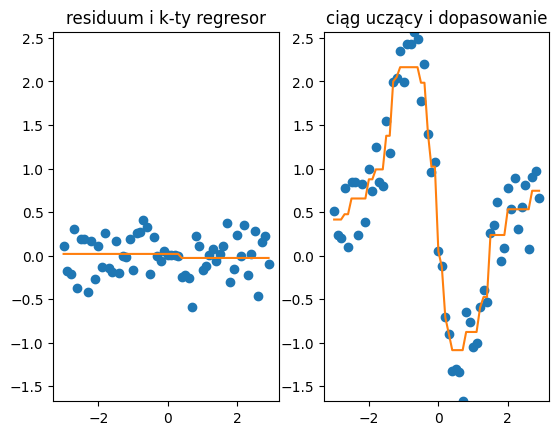

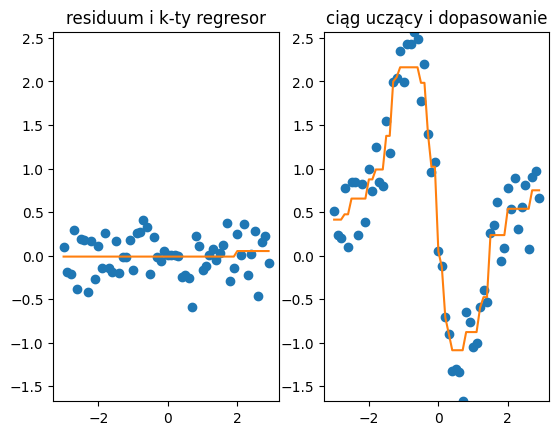

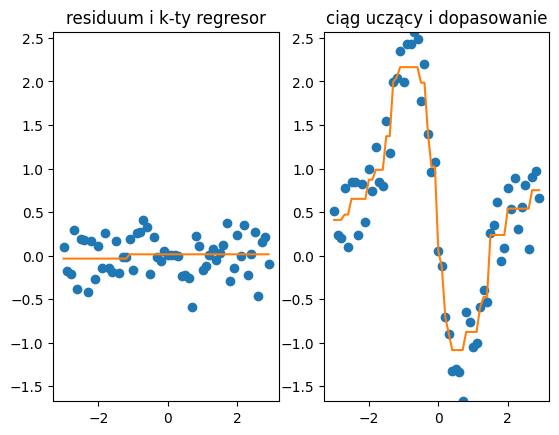

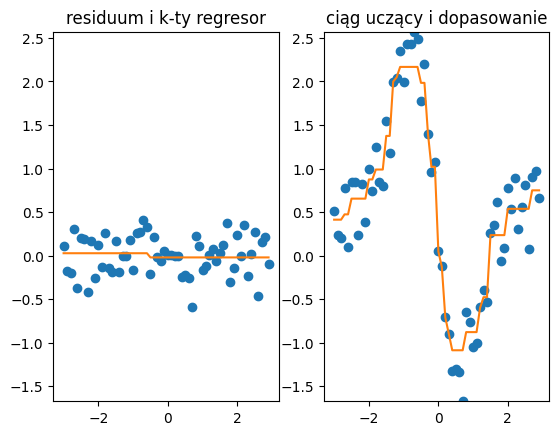

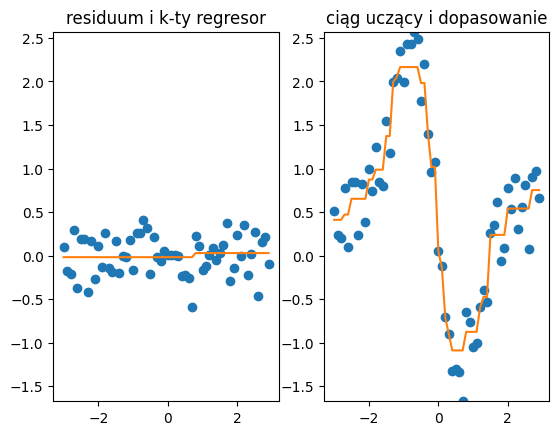

In [ ]:
Nboost = 350
alpha = 0.1

predyktory = []

mu = np.mean(Y)
F0 = mu*np.ones(len(X))
dY = Y -F0 # na początek

for k in range(Nboost):
  fig = plt.figure()

  # fitujemy predyktor do aktualnego residuum
  predyktory.append(DecisionTreeRegressor(max_depth =1).fit(X,dY))
  Y_hat_k = predyktory[k].predict(X) # uzyskuję przewidywania k-tego predyktora

  rysuj_residuum_i_regresor(X,Y,dY, Y_hat_k, fig )

  dY = dY - alpha* Y_hat_k #Uaktualniam residuudm

  Y_pred = predict_boosted(F0, predyktory, alpha, X)
  rysuj_dopasowanie(X,Y, Y_pred, fig)

## Przykład z danymi tabelarycznymi ze StatQuest:

In [ ]:
%%HTML
<iframe width="560" height="315" src="https://www.youtube.com/embed/3CC4N4z3GJc?start=342&amp;end=899")>

---

# Problem klasyfikacji

Dla problemu klasyfikacji binarnej z klsami $\{0,1\}$ bezpośrednia próba przewidywnia prawdopodobieństwa klasy za pomocą rozwinięcia addytywnego jest kłopotliwa bo trudno byłoby zapewnić, że w ramach dokładania kolejnych boostów nie wychodzilibyśmy poza zakres [0,1].

## Dogodna funkcja kosztu
Popracujemy teraz nad wyprowadzeniem dogodnej funkcji kosztu.

Mamy ciąg uczący $\{ x^{(i)}, y^{(i)} \}_{i=1}^N$, Funkcja log-wiarygodności jego zaobserwowania to
$$\log L = \sum_{i=1}^N y^{(i)} \log p^{(i)} +(1-y^{(i)} ) \log(1-p^{(i)})$$

- czym lepsze predykcje $p$ tym większa jest wartość tej funkcji
  - jako funkcja kosztu potrzebna jest nam jakś wersja przemnożona przez  $-1$.
  - Taka funkcja nazywa się negative loglikelihood NLL.
$$ NLL = - \sum_{i=1}^N y^{(i)} \log p^{(i)} +(1-y^{(i)} ) \log(1-p^{(i)})$$

a rozważając ją dla pojedynczego przykładu możemy pominąć sumowanie i indeksy:

$$ NLL = -  y \log p -(1-y ) \log(1-p)$$

Tą funkcję warto jeszcze przekształcić tak aby była funkcją logarytmu szansy.


### Dygresja o szansie

Jeśli mamy $m$ zdarzeń sprzyjających jakiemuś zdarzeniu i $q$ przeciwnych to prawdopodobieństwo tego zdarzenia to $ p = \frac{m}{m+q}$ natomiast szanse to $s = \frac{m}{q}$.


Wynikają z tego następujące związki:
$$ p = \frac{s}{s+1}, \quad s = \frac{p}{1-p}, \quad \frac{1}{1+s} = \frac{p}{s} = 1-p$$




<img src="https://www.fuw.edu.pl/~jarekz/WYKLADY/UM/W7_drzewa/szansa.png">

## Przekształcenie $NLL(p)$ w $NLL(\log s)$

$$NLL(p) = - y \log p  - (1-y) \log (1-p) $$

$$= - y \log p  - \log(1-p ) + y \log (1-p) $$

$$= - y \log \underbrace{\frac{p}{1-p} }_s - \log(1-p )  $$

$$= - y \log s  - \log(1-p )  $$

$$= - y \log s  - \log\left(\frac{1}{1+s} \right)  $$

$$= - y \log s  - \left(\log 1 - \log (1+s) \right)  $$

$$= - y \log s  + \log (1+s)  $$

$$NLL (\log s)= - y \log s  + \log \left(1+ e^{\log s} \right)  $$

## pochodne NLL
W dalszych rachunkach przyda nam się pierwsza i druga pochodna NLL względem $\log s$

### pirewsza pochodna
$$\frac{d }{d \log s} NLL=$$

$$\frac{d}{d \log s} \left(-y \log s + \log \left( 1+ e^{\log s} \right)\right) $$

$$ = -y + \frac{1}{1+e^{\log s}} e^{\log s} $$

$$ = -y + \frac{e^{\log s} }{1+e^{\log s}} $$

i na tym można by skończyć, ale czasem wygodnie jest wyrazić ten gradient przez $p$
$$ \frac{d }{d \log s} NLL= -y + \frac{s}{1+s} $$
$$  = -y + p $$

### druga pochodna

$$\frac{d }{d \log s} \left(  -y + \frac{e^{\log s} }{1+e^{\log s}}\right) = $$

$$ = \frac{e^{\log s} (1+e^{\log s} )- e^{\log s}e^{\log s} }{\left( 1+e^{\log s}\right)^2}$$

$$ = \frac{e^{\log s} }{\left( 1+e^{\log s}\right)^2}$$

można ją też wyrazić poprzez $p$:

$$ = \frac{e^{\log s}\cdot 1 }{\left( 1+e^{\log s}\right)\left( 1+e^{\log s}\right)}$$

$$ = \frac{e^{\log s} }{\left( 1+e^{\log s}\right)} \cdot \frac{1 }{\left( 1+e^{\log s}\right)} $$

$$ = \frac{ s}{ 1+s} \cdot \frac{1 }{ 1+s} $$

$$ = p \cdot (1-p) $$

## Algorytm
Uzbrojeni w te wzory możemy teraz przyjrzeć się jak w przypadku klasyfikacji będzie wyglądał algorytm gradient boost.

Numeracja kroków odnosi się do numeracji z algorytmu generycznego:
1. $F_0(x) = \arg \min_{\rho} \sum_{i = 1}^N L(y^{(i)}, \rho)$
 - w tym przypadku $\rho = \log s$
 podstawiając naszą funkcję koszu $NLL$ mamy:
$$F_0(x) = \arg \min_{\rho} \sum_{i = 1}^N - y^{(i)} \log s  + \log \left(1+ e^{\log s} \right) $$

  - aby wykonać tą mininmalizację trzeba policzyć gradient $NLL$ i przyrównać do zera (na dobry początek nasze przewidywnia dla wszystkich punktów są jednakowe):
  $$ \frac{d }{d \log s} NLL= \sum_{i=1}^N (-y^{(i)} + p)  $$
$$\sum_{i=1}^N (-y^{(i)} + p) =0 $$
$$\sum_{i=1}^N -y^{(i)}  = - Np $$
$$ p = \frac{\sum_{i=1}^N y^{(i)}}{ N} $$
$$ \log s = \log\frac{p}{1-p} $$

$$F_0(x) = \log s = \log{ \frac{ \frac{\sum_{i=1}^N y^{(i)}}{N}
                      }
                      {
                        1 - \frac{\sum_{i=1}^N y^{(i)}}{N}
                      }}$$

2. dla $m = 1,\dots,M$:
  3. oblicz pseudo odpowiedzi dla wszystkich punktów $(i)$:
  $\hat y^{(i)} = -g_m^{(i)}= -\left[  \frac{\partial  L(y^{(i)},F(x^{(i)}))]}{\partial F(x^{(i)})}\right]_{F(x) = F_{m-1}(x)}$  
  

  - podstawiając do tego ogólnego wzoru wyliczoną pochodną mamy:
$$\hat y^{(i)} = - \left(-y^{(i)} +\frac{e^{\log s^{(i)}}}{1+e^{\log s^{(i)}}} \right)= y^{(i)} - p^{(i)} $$

  4. dopasuj predyktor:
  $a_m = \arg \min_{a, \beta} \sum_{i = 1}^N \left[-g_m(x^{(i)}) -\beta h(x^{(i)},a) \right]^2$
    - dopasowujemy drzewo do wartości $\hat y$ aby wytworzyć obszary końcowe $R_{i,j} $ związane z liśćmi $j$ (który przykład $i$ wpada do którego liścia $j$)

  5. dopasuj długość kroku (wartości zwracane przez poszczególne liście):
    - dla $j=1,\dots,J_M$
    $$ \rho_{j,m} = \arg \min_{\rho} \sum_{x \in R_{i,j}} L \left(y^{(i)} , F_{m-1}(x^{(i)}) + \rho  \right)$$

   - wstawiając tu naszą fukcję kosztu $NLL$ otrzymujemy:
     $$ \rho_{j,m} = \arg \min_{\rho}
       \sum_{x \in R_{i,j}} -y^{(i)} \left( F_{m-1}(x^{(i)}) +\rho \right) +\log \left( 1 + e^{F_{m-1}(x^{(i)}) +\rho }\right)
     $$

  6. uaktualnij predykcję:
  $F_m(x) = F_{m-1}(x) + \alpha \sum_{j=1}^{J_M}\rho_{j,m} 1\{x \in R_{j,m}\}$

---
Jeszcze klika słów o minimalizacji wykonywanej w kroku 5:

 - bezpośrednie policzenie gradientu i przyrównanie go do 0 jest bardzo nieprzyjemne.

W praktyce posługujemy się rozwinięciem Tylora funkcji kosztu do rzędu 2:

$$ L\left(y^{(i)}, F_{m-1}(x^{(i)} +\rho)\right)
\approx L\left(y^{(i)}, F_{m-1}(x^{(i)} )\right) $$
$$+ \frac{d}{dF()} L\left(y^{(i)}, F_{m-1}(x^{(i)} )\right) \rho $$
$$ + \frac{1}{2}\frac{d^2}{dF^2()} L\left(y^{(i)}, F_{m-1}(x^{(i)} )\right) \rho^2$$

Obliczamy pochodną tego rozwinięcia:

$$ \frac{d}{d\rho} L\left(y^{(i)}, F_{m-1}(x^{(i)} +\rho)\right) \approx    \frac{d}{dF()} L\left(y^{(i)}, F_{m-1}(x^{(i)} )\right)  + \frac{d^2}{dF^2()} L\left(y^{(i)}, F_{m-1}(x^{(i)} )\right) \rho $$

i korzystając z policzonych wcześniej pierwszej i drugiej pochodnej $NLL$ mamy


$$     \frac{d}{dF()} L\left(y^{(i)}, F_{m-1}(x^{(i)} )\right)  + \frac{d^2}{dF^2()} L\left(y^{(i)}, F_{m-1}(x^{(i)} )\right) \rho = \left(-y^{(i)}+p^{(i)} \right) + \left(p^{(i)} (1-p^{(i)}) \right)\rho $$

w tym przybliżeniu:
$$\left(-y^{(i)}+p^{(i)} \right) + \left(p^{(i)} (1-p^{(i)}) \right)\rho =0$$
 $$\rho = \frac{y^{(i)} - p^{(i)}}{p^{(i)} (1-p^{(i)})}$$


  Jeśli do danego liścia trafia więcej niż jeden przykład to w tym wyrażeniu trzeba posumować przyczynki od wszystkich takich przykładów:
 $$\rho = \frac{\sum_{x \in R_{j,m}} \left( y^{(i)} - p^{(i)}\right)}{\sum_{x \in R_{j,m}} \left(p^{(i)} (1-p^{(i)}) \right)}$$

## Przykład klasyfikacji ze StatQuest:

In [ ]:
%%HTML
<iframe width="560" height="315" src="https://www.youtube.com/embed/jxuNLH5dXCs?start=50&amp;end=950">

---

# Biblioteki implementujące techniki gradient boost:
XGBoost, LightGBM and CatBoost, oraz moduł w sklearn

Porównianie efektywności bilbliotek:
https://link.springer.com/article/10.1007/s10462-020-09896-5

> The results of this comparison indicate that CatBoost obtains the best results in generalization accuracy and AUC in the studied datasets although the differences are small. LightGBM is the fastest of all methods but not the most accurate. Finally, XGBoost places second both in accuracy and in training speed.
>
Z tego cytatu mogłoby wynikać że faktycznie istnieją konkretne różnice pomiędzy efektywnością modeli implementowanych w poszczególnych bibliotekach, ale popatrzmy na tabelę, którą zamieścili autorzy:

https://link.springer.com/article/10.1007/s10462-020-09896-5/tables/4


Inne materiały wideo:
    
Gradient boosting
https://www.youtube.com/watch?v=sRktKszFmSk

https://www.youtube.com/watch?v=zblsrxc7XpM


StatQuest:
regresja:

1) https://www.youtube.com/watch?v=3CC4N4z3GJc

2) https://www.youtube.com/watch?v=2xudPOBz-vs

Klasyfikacja:

3) https://www.youtube.com/watch?v=jxuNLH5dXCs

4) https://www.youtube.com/watch?v=StWY5QWMXCw